In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly.offline as py
import plotly. express as px
import plotly.graph_objects as go
 

# What are Diamonds?

Diamonds are the Precious stone consisting of a clear and colourless Crystalline form of pure carbon.
They are the hardest Gemstones known to man and can be scratched only by other Diamonds.

# Why are Diamonds so Valuable?

Whether it is a Rare book, a fine bottle of Scotch, or a Diamond, something that is Rare and Unique is often expensive.
But what makes it truly Valuable is that this Rarity coincides with the desire of many to possess it. ;)
Diamonds are Rare because of the Incredibly powerful forces needed to create them.
And therefore Diamonds are considered to be Very Costly.

# Dataset Description

This classic dataset contains the prices and other attributes of almost 54,000 diamonds. It's a great dataset for beginners learning to work with data analysis and visualization.

# Content
price price in US dollars (\$326--\$18,823)

carat weight of the diamond (0.2--5.01)

cut quality of the cut (Fair, Good, Very Good, Premium, Ideal)

color diamond colour, from J (worst) to D (best)

clarity a measurement of how clear the diamond is (I1 (worst), SI2, SI1, VS2, VS1, VVS2, VVS1, IF (best))

x length in mm (0--10.74)

y width in mm (0--58.9)

z depth in mm (0--31.8)

depth total depth percentage = z / mean(x, y) = 2 * z / (x + y) (43--79)

table width of top of diamond relative to widest point (43--95)

In [2]:
Data = pd.read_csv("D:\\diamonds.csv")

In [3]:
Data.head()

,carat,cut,color,clarity,depth,tbl,price,x,y,z
0,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43
1,0.21,Premium,E,SI1,59.8,61.0,326,3.89,3.84,2.31
2,0.23,Good,E,VS1,56.9,65.0,327,4.05,4.07,2.31
3,0.29,Premium,I,VS2,62.4,58.0,334,4.20,4.23,2.63
4,0.31,Good,J,SI2,63.3,58.0,335,4.34,4.35,2.75


In [4]:
Data.tail()

,carat,cut,color,clarity,depth,tbl,price,x,y,z
53935,0.72,Ideal,D,SI1,60.8,57.0,2757,5.75,5.76,3.50
53936,0.72,Good,D,SI1,63.1,55.0,2757,5.69,5.75,3.61
53937,0.70,Very Good,D,SI1,62.8,60.0,2757,5.66,5.68,3.56
53938,0.86,Premium,H,SI2,61.0,58.0,2757,6.15,6.12,3.74
53939,0.75,Ideal,D,SI2,62.2,55.0,2757,5.83,5.87,3.64


In [5]:
Data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53940 entries, 0 to 53939
Data columns (total 10 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   carat    53940 non-null  float64
 1   cut      53940 non-null  object 
 2   color    53940 non-null  object 
 3   clarity  53940 non-null  object 
 4   depth    53940 non-null  float64
 5   tbl      53940 non-null  float64
 6   price    53940 non-null  int64  
 7   x        53940 non-null  float64
 8   y        53940 non-null  float64
 9   z        53940 non-null  float64
dtypes: float64(6), int64(1), object(3)
memory usage: 4.1+ MB


In [6]:
Data.isnull().sum()

carat      0
cut        0
color      0
clarity    0
depth      0
tbl        0
price      0
x          0
y          0
z          0
dtype: int64

In [7]:
Data.shape

(53940, 10)

In [8]:
Data.describe()

,carat,depth,tbl,price,x,y,z
count,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000
mean,0.797940,61.749405,57.457184,3932.799722,5.731157,5.734526,3.538734
std,0.474011,1.432621,2.234491,3989.439738,1.121761,1.142135,0.705699
min,0.200000,43.000000,43.000000,326.000000,0.000000,0.000000,0.000000
25%,0.400000,61.000000,56.000000,950.000000,4.710000,4.720000,2.910000
50%,0.700000,61.800000,57.000000,2401.000000,5.700000,5.710000,3.530000
75%,1.040000,62.500000,59.000000,5324.250000,6.540000,6.540000,4.040000
max,5.010000,79.000000,95.000000,18823.000000,10.740000,58.900000,31.800000


# Features
Carat : Carat weight of the Diamond.
Cut : Describe cut quality of the diamond.
Quality in increasing order Fair, Good, Very Good, Premium, Ideal .
Color : Color of the Diamond.
With D being the best and J the worst.
Clarity : Diamond Clarity refers to the absence of the Inclusions and Blemishes.
(In order from Best to Worst, FL = flawless, I3= level 3 inclusions) FL, IF, VVS1, VVS2, VS1, VS2, SI1, SI2, I1, I2, I3
Depth : The Height of a Diamond, measured from the Culet to the table, divided by its average Girdle Diameter.
Table : The Width of the Diamond's Table expressed as a Percentage of its Average Diameter.
Price : the Price of the Diamond.
X : Length of the Diamond in mm.
Y : Width of the Diamond in mm.
Z : Height of the Diamond in mm.
Qualitative Features (Categorical) : Cut, Color, Clarity.

Quantitative Features (Numerical) : Carat, Depth , Table , Price , X , Y, Z.

In [9]:
# Categorical column's details :
Data.describe(include='O')

,cut,color,clarity
count,53940,53940,53940
unique,5,7,8
top,Ideal,G,SI1
freq,21551,11292,13065


In [10]:
Data.corr()

,carat,depth,tbl,price,x,y,z
carat,1.000000,0.028224,0.181618,0.921591,0.975094,0.951722,0.953387
depth,0.028224,1.000000,-0.295779,-0.010647,-0.025289,-0.029341,0.094924
tbl,0.181618,-0.295779,1.000000,0.127134,0.195344,0.183760,0.150929
price,0.921591,-0.010647,0.127134,1.000000,0.884435,0.865421,0.861249
x,0.975094,-0.025289,0.195344,0.884435,1.000000,0.974701,0.970772
y,0.951722,-0.029341,0.183760,0.865421,0.974701,1.000000,0.952006
z,0.953387,0.094924,0.150929,0.861249,0.970772,0.952006,1.000000


In [11]:
Data['cut'].value_counts()

Ideal        21551
Premium      13791
Very Good    12082
Good          4906
Fair          1610
Name: cut, dtype: int64

In [12]:
Data['color'].value_counts()

G    11292
E     9797
F     9542
H     8304
D     6775
I     5422
J     2808
Name: color, dtype: int64

In [13]:
Data['clarity'].value_counts()

SI1     13065
VS2     12258
SI2      9194
VS1      8171
VVS2     5066
VVS1     3655
IF       1790
I1        741
Name: clarity, dtype: int64

In [14]:
print('X-Values with zero value ',Data['x'].value_counts()[0])
print('Y-Values with zero value ',Data['y'].value_counts()[0])
print('Z-Values with zero value ',Data['z'].value_counts()[0])
print("Number of rows with depth == 0: {} ".format((Data.depth==0).sum()))

X-Values with zero value  8
Y-Values with zero value  7
Z-Values with zero value  20
Number of rows with depth == 0: 0 


The minimum values for x,y and z here are 0 but it is not possible because according to the data description they are the length, width and depth¶

In [15]:
Data.loc[(Data['x']==0) | (Data['y']==0) | (Data['z']==0)]

,carat,cut,color,clarity,depth,tbl,price,x,y,z
2207,1.00,Premium,G,SI2,59.1,59.0,3142,6.55,6.48,0.0
2314,1.01,Premium,H,I1,58.1,59.0,3167,6.66,6.60,0.0
4791,1.10,Premium,G,SI2,63.0,59.0,3696,6.50,6.47,0.0
5471,1.01,Premium,F,SI2,59.2,58.0,3837,6.50,6.47,0.0
10167,1.50,Good,G,I1,64.0,61.0,4731,7.15,7.04,0.0
11182,1.07,Ideal,F,SI2,61.6,56.0,4954,0.00,6.62,0.0
11963,1.00,Very Good,H,VS2,63.3,53.0,5139,0.00,0.00,0.0
13601,1.15,Ideal,G,VS2,59.2,56.0,5564,6.88,6.83,0.0
15951,1.14,Fair,G,VS1,57.5,67.0,6381,0.00,0.00,0.0
24394,2.18,Premium,H,SI2,59.4,61.0,12631,8.49,8.45,0.0


In [16]:
len(Data[(Data['x']==0) | (Data['y']==0) | (Data['z']==0)])

20

In [17]:
Data = Data[(Data[['x','y','z']] != 0).all(axis=1)]

In [18]:
# Just to Confirm
Data.loc[(Data['x']==0) | (Data['y']==0) | (Data['z']==0)]

,carat,cut,color,clarity,depth,tbl,price,x,y,z


# visualizing trends between attributes

<AxesSubplot:xlabel='clarity', ylabel='price'>

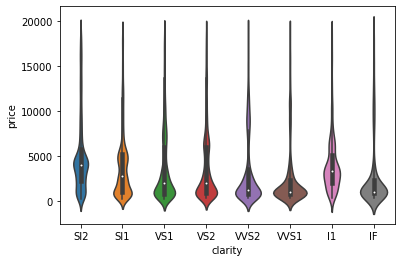

In [19]:
sns.violinplot(y='price',x='clarity',data=Data)

<AxesSubplot:xlabel='cut', ylabel='price'>

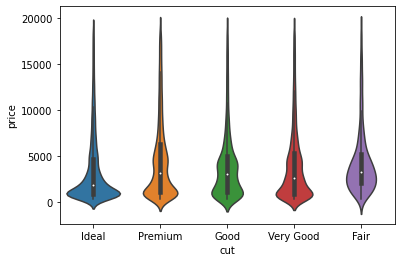

In [20]:
sns.violinplot(y='price',x='cut',data=Data)

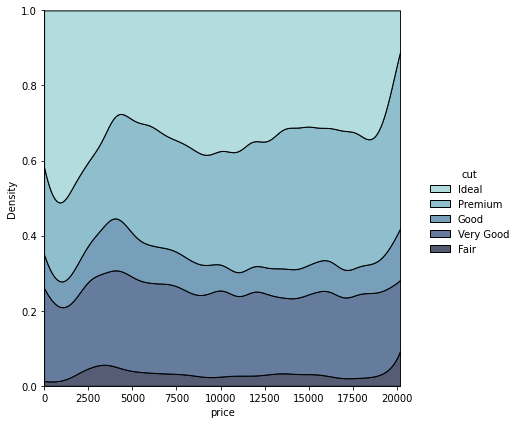

In [14]:
sns.displot(data=Data,x='price',hue='cut',kind='kde',height=6,multiple="fill",clip=(0,None),palette="ch:rot=-.25,hue=1,light=.75")

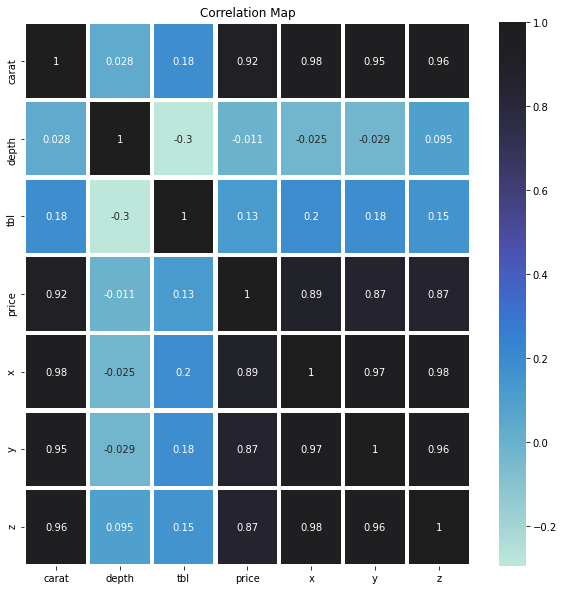

In [21]:
#Correlation Map- Right side shows value of color left side shows values that appeal to colors
plt.figure(figsize=(10,10))
plt.title('Correlation Map')
ax=sns.heatmap(Data.corr(),
               linewidth=3.1,
               annot=True,
               center=1)

c:\users\dileep\appdata\local\programs\python\python38\lib\site-packages\seaborn\distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='price'>

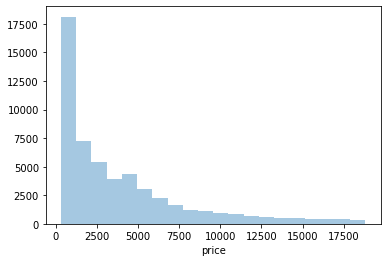

In [18]:
# One of the most important visualization styles is histogram
sns.distplot(Data.price, kde = False , bins= 20)

In [39]:
fig = px.box(Data, x='price')
fig.show()

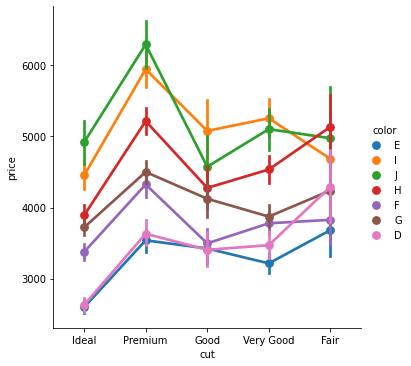

In [19]:
#Catplot inside Seaborn function is significiant for me because of awesome . It contributes to Visualization.
sns.catplot(x="cut",y="price",hue="color",kind="point",data=Data)

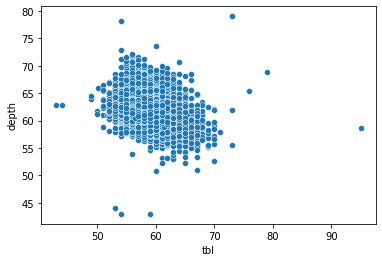

In [21]:
#It gives between relationship table and depth
sns.scatterplot(x="tbl",y="depth",data=Data);

In [36]:
#LMPLOT I think it offers smooth visuals that is why i am always using that method.I think, this method is very useful for ML algorithms.
#sns.lmplot(x="carat",y="price",hue = 'color',  data=Data);

In [40]:
fig = px.scatter(Data, x="carat", y="price", facet_col="cut", color='color')
fig.show()

c:\users\dileep\appdata\local\programs\python\python38\lib\site-packages\seaborn\categorical.py:3704: UserWarning:

The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.



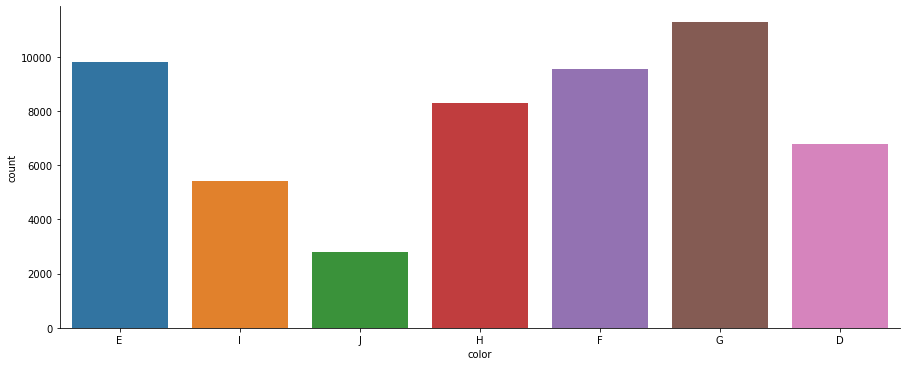

In [23]:
sns.factorplot(x='color', data=Data , kind='count',aspect=2.5 )

In [25]:
def skew_test(Data):
    col = Data.skew(axis = 0, skipna = True)
    val = Data.skew(axis = 0, skipna = True)
    sk_table = pd.concat([col, val], axis=1)
    
    sk_table = sk_table.rename(
    columns = {0 : "skewness"})
    
    return sk_table.drop([1], axis = 1).sort_values("skewness", ascending = False).reset_index()

In [23]:
# Create a list of numeric columns
num_feat = [col for col in Data.select_dtypes(include='number').columns]
# Create a list of categorical columns
cat_feat = [col for col in Data.select_dtypes("object").columns]
Data.head()

,carat,cut,color,clarity,depth,tbl,price,x,y,z
0,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43
1,0.21,Premium,E,SI1,59.8,61.0,326,3.89,3.84,2.31
2,0.23,Good,E,VS1,56.9,65.0,327,4.05,4.07,2.31
3,0.29,Premium,I,VS2,62.4,58.0,334,4.20,4.23,2.63
4,0.31,Good,J,SI2,63.3,58.0,335,4.34,4.35,2.75


In [26]:
skk = skew_test(Data[num_feat])

In [27]:
skk['kurtosis'] = Data[num_feat].kurtosis().values
skk.style.background_gradient(cmap='Blues')

,index,skewness,kurtosis
0,y,2.462211,1.255240
1,price,1.618349,5.746307
2,z,1.585490,2.801738
3,carat,1.116207,2.178391
4,tbl,0.796799,-0.703561
5,x,0.398348,91.826238
6,depth,-0.081726,47.764571


In [34]:
# Will drop these outliers later on
Data[Data['x'] <1]

,carat,cut,color,clarity,depth,tbl,price,x,y,z
11182,1.07,Ideal,F,SI2,61.6,56.0,4954,0.0,6.62,0.0
11963,1.00,Very Good,H,VS2,63.3,53.0,5139,0.0,0.00,0.0
15951,1.14,Fair,G,VS1,57.5,67.0,6381,0.0,0.00,0.0
24520,1.56,Ideal,G,VS2,62.2,54.0,12800,0.0,0.00,0.0
26243,1.20,Premium,D,VVS1,62.1,59.0,15686,0.0,0.00,0.0
27429,2.25,Premium,H,SI2,62.8,59.0,18034,0.0,0.00,0.0
49556,0.71,Good,F,SI2,64.1,60.0,2130,0.0,0.00,0.0
49557,0.71,Good,F,SI2,64.1,60.0,2130,0.0,0.00,0.0


In [41]:
fig = px.scatter(Data, x='carat', y='depth', size='carat', color='color', opacity=0.4)
fig.show()

In [42]:
fig = px.pie(Data, values='price', names='cut', color_discrete_sequence=px.colors.sequential.RdBu)
fig.show()

In [43]:
labels = Data['clarity'].value_counts().index
values = Data['clarity'].value_counts().values

# Use `hole` to create a donut-like pie chart
fig = go.Figure(data=[go.Pie(labels=labels, values=values, hole=.5,marker_colors=px.colors.sequential.Jet)])
fig.show()


In [44]:
fig = px.box(Data, x='clarity', y='depth', color='clarity')
fig.update_traces(quartilemethod="exclusive")
fig.show()

Text(0.5, 1.0, 'Distribution of Diamond tbl')

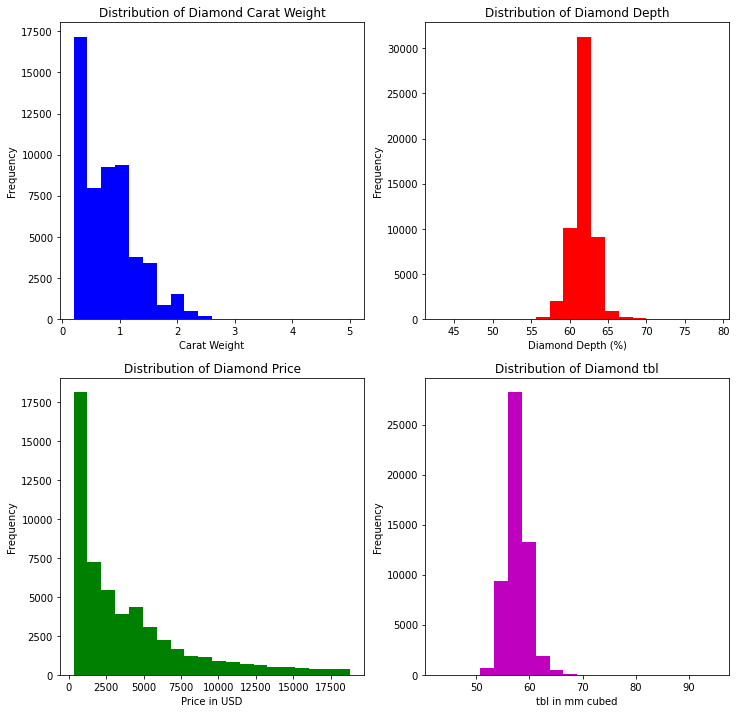

In [8]:
plt.figure(figsize=[12,12])

# First subplot showing the diamond carat weight distribution
plt.subplot(221)
plt.hist(Data['carat'],bins=20,color='b')
plt.xlabel('Carat Weight')
plt.ylabel('Frequency')
plt.title('Distribution of Diamond Carat Weight')

# Second subplot showing the diamond depth distribution
plt.subplot(222)
plt.hist(Data['depth'],bins=20,color='r')
plt.xlabel('Diamond Depth (%)')
plt.ylabel('Frequency')
plt.title('Distribution of Diamond Depth')

# Third subplot showing the diamond price distribution
plt.subplot(223)
plt.hist(Data['price'],bins=20,color='g')
plt.xlabel('Price in USD')
plt.ylabel('Frequency')
plt.title('Distribution of Diamond Price')

# Fourth subplot showing the diamond volume distribution
plt.subplot(224)
plt.hist(Data['tbl'],bins=20,color='m')
plt.xlabel('tbl in mm cubed')
plt.ylabel('Frequency')
plt.title('Distribution of Diamond tbl')

In [14]:
train = pd.read_csv("D:\\diamonds.csv")

In [15]:
import sweetviz

In [16]:
report = sweetviz.analyze([train,'train'],target_feat='x')
report.show_html('report.html')

                                             |                                             | [  0%]   00:00 ->…

Report report.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [10]:
# Modelling Algorithms :


# Regression
from sklearn.linear_model import LinearRegression,Ridge,Lasso,RidgeCV, ElasticNet
from sklearn.ensemble import RandomForestRegressor,BaggingRegressor,GradientBoostingRegressor,AdaBoostRegressor 
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neural_network import MLPRegressor

# Modelling Helpers :
from sklearn.preprocessing import Normalizer , scale
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import RFECV
from sklearn.model_selection import GridSearchCV , KFold , cross_val_score

#preprocessing :
from sklearn.preprocessing import MinMaxScaler , StandardScaler, LabelEncoder

# Regression
from sklearn.metrics import mean_squared_log_error,mean_squared_error, r2_score,mean_absolute_error 

# Classification
from sklearn.metrics import accuracy_score,precision_score,recall_score,f1_score  
# Visualisation
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.pylab as pylab
import seaborn as sns
import missingno as msno

In [11]:
from sklearn.impute import SimpleImputer

In [12]:
Data.drop(['x','y','z'], axis=1, inplace= True)
#df.head()

Feature Encoding

Label the Categorical Features with digits to Distinguish.
As we can't feed String data for Modelling.

In [13]:
label_cut = LabelEncoder()
label_color = LabelEncoder()
label_clarity = LabelEncoder()


Data['cut'] = label_cut.fit_transform(Data['cut'])
Data['color'] = label_color.fit_transform(Data['color'])
Data['clarity'] = label_clarity.fit_transform(Data['clarity'])

Feature Scaling

Divide the Dataset into Train and Test, So that we can fit the Train for Modelling Algos and Predict on Test.
Then Apply Feature Scaling although it's not neccessary in this case. But it surely helps.

Split the data into train and test.

In [15]:
X = Data.drop(['price'], axis=1)
y = Data['price']

X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2, random_state=66)

 Applying Feature Scaling ( StandardScaler )
You can also Apply MinMaxScaler.

In [16]:
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

Modelling Algos

In [17]:
# Collect all R2 Scores.
R2_Scores = []
models = ['Linear Regression' , 'Lasso Regression' , 'AdaBoost Regression' , 'Ridge Regression' , 'GradientBoosting Regression',
          'RandomForest Regression' ,
         'KNeighbours Regression']

# Linear Regression

In [43]:
clf_lr = LinearRegression()
clf_lr.fit(X_train , y_train)
accuracies = cross_val_score(estimator = clf_lr, X = X_train, y = y_train, cv = 5,verbose = 1)
y_pred = clf_lr.predict(X_test)
print('')
print('####### Linear Regression #######')
print('Score : %.4f' % clf_lr.score(X_test, y_test))
print(accuracies)

mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred)**0.5
r2 = r2_score(y_test, y_pred)

print('')
print('MSE    : %0.2f ' % mse)
print('MAE    : %0.2f ' % mae)
print('RMSE   : %0.2f ' % rmse)
print('R2     : %0.2f ' % r2)

R2_Scores.append(r2)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s finished



####### Linear Regression #######
Score : 0.8814
[0.87871812 0.8834748  0.87754762 0.87632017 0.88382049]

MSE    : 1912085.43 
MAE    : 926.89 
RMSE   : 1382.78 
R2     : 0.88 


# Lasso Regression

In [44]:
clf_la = Lasso(normalize=True)
clf_la.fit(X_train , y_train)
accuracies = cross_val_score(estimator = clf_la, X = X_train, y = y_train, cv = 5,verbose = 1)
y_pred = clf_la.predict(X_test)
print('')
print('###### Lasso Regression ######')
print('Score : %.4f' % clf_la.score(X_test, y_test))
print(accuracies)

mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred)**0.5
r2 = r2_score(y_test, y_pred)

print('')
print('MSE    : %0.2f ' % mse)
print('MAE    : %0.2f ' % mae)
print('RMSE   : %0.2f ' % rmse)
print('R2     : %0.2f ' % r2)

R2_Scores.append(r2)


###### Lasso Regression ######
Score : 0.8658
[0.86639124 0.86894756 0.86380579 0.86534687 0.86971082]

MSE    : 2163743.82 
MAE    : 909.89 
RMSE   : 1470.97 
R2     : 0.87 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


# AdaBosst Regression

In [45]:
clf_ar = AdaBoostRegressor(n_estimators=1000)
clf_ar.fit(X_train , y_train)
accuracies = cross_val_score(estimator = clf_ar, X = X_train, y = y_train, cv = 5,verbose = 1)
y_pred = clf_ar.predict(X_test)
print('')
print('###### AdaBoost Regression ######')
print('Score : %.4f' % clf_ar.score(X_test, y_test))
print(accuracies)

mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred)**0.5
r2 = r2_score(y_test, y_pred)

print('')
print('MSE    : %0.2f ' % mse)
print('MAE    : %0.2f ' % mae)
print('RMSE   : %0.2f ' % rmse)
print('R2     : %0.2f ' % r2)

R2_Scores.append(r2)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   19.0s finished



###### AdaBoost Regression ######
Score : 0.8792
[0.86582825 0.8868433  0.88073412 0.85958015 0.89020912]

MSE    : 1946817.09 
MAE    : 1084.64 
RMSE   : 1395.28 
R2     : 0.88 


# Ridge Regression

In [46]:
clf_rr = Ridge(normalize=True)
clf_rr.fit(X_train , y_train)
accuracies = cross_val_score(estimator = clf_rr, X = X_train, y = y_train, cv = 5,verbose = 1)
y_pred = clf_rr.predict(X_test)
print('')
print('###### Ridge Regression ######')
print('Score : %.4f' % clf_rr.score(X_test, y_test))
print(accuracies)

mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred)**0.5
r2 = r2_score(y_test, y_pred)

print('')
print('MSE    : %0.2f ' % mse)
print('MAE    : %0.2f ' % mae)
print('RMSE   : %0.2f ' % rmse)
print('R2     : %0.2f ' % r2)

R2_Scores.append(r2)


###### Ridge Regression ######
Score : 0.6355
[0.63998878 0.63926462 0.6326636  0.64215161 0.63267374]

MSE    : 5875610.27 
MAE    : 1718.06 
RMSE   : 2423.97 
R2     : 0.64 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


# GradientBoosting Regression

In [47]:
clf_gbr = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1,max_depth=1, random_state=0, loss='ls',verbose = 1)
clf_gbr.fit(X_train , y_train)
accuracies = cross_val_score(estimator = clf_gbr, X = X_train, y = y_train, cv = 5,verbose = 1)
y_pred = clf_gbr.predict(X_test)
print('')
print('###### Gradient Boosting Regression #######')
print('Score : %.4f' % clf_gbr.score(X_test, y_test))
print(accuracies)

mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred)**0.5
r2 = r2_score(y_test, y_pred)

print('')
print('MSE    : %0.2f ' % mse)
print('MAE    : %0.2f ' % mae)
print('RMSE   : %0.2f ' % rmse)
print('R2     : %0.2f ' % r2)

R2_Scores.append(r2)

      Iter       Train Loss   Remaining Time 
         1    14014358.8176            2.37s
         2    12444915.7152            2.20s
         3    11135723.6991            2.07s
         4     9958464.6754            2.09s
         5     8998076.0376            2.07s
         6     8127705.5741            2.02s
         7     7407911.6491            1.95s
         8     6786700.2575            1.90s
         9     6228895.9266            1.85s
        10     5766987.2002            1.88s
        20     3250309.3275            1.63s
        30     2445402.6104            1.35s
        40     2153227.8224            1.14s
        50     1971325.1287            0.95s
        60     1835467.7530            0.80s
        70     1730441.1789            0.62s
        80     1650419.7920            0.40s
        90     1587546.1563            0.20s
       100     1537542.1321            0.00s
      Iter       Train Loss   Remaining Time 
         1    13999168.3655            1.55s

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.



         2    12436341.4481            2.04s
         3    11118780.6649            2.06s
         4     9967424.5905            1.89s
         5     8995577.1750            1.76s
         6     8134461.3704            1.55s
         7     7413175.4470            1.52s
         8     6776079.3431            1.53s
         9     6243697.7029            1.35s
        10     5768823.8075            1.38s
        20     3257876.2742            1.36s
        30     2449553.0897            1.14s
        40     2157368.1100            0.97s
        50     1974296.7100            0.79s
        60     1837035.0469            0.63s
        70     1732137.6299            0.49s
        80     1651174.9466            0.33s
        90     1587785.4615            0.16s
       100     1537756.8792            0.00s
      Iter       Train Loss   Remaining Time 
         1    14046861.1306            1.88s
         2    12476989.9708            1.71s
         3    11152100.0157            1.62s
        

[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    8.4s finished


# RandomForest Regression

In [48]:
clf_rf = RandomForestRegressor()
clf_rf.fit(X_train , y_train)
accuracies = cross_val_score(estimator = clf_rf, X = X_train, y = y_train, cv = 5,verbose = 1)
y_pred = clf_rf.predict(X_test)
print('')
print('###### Random Forest ######')
print('Score : %.4f' % clf_rf.score(X_test, y_test))
print(accuracies)

mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred)**0.5
r2 = r2_score(y_test, y_pred)

print('')
print('MSE    : %0.2f ' % mse)
print('MAE    : %0.2f ' % mae)
print('RMSE   : %0.2f ' % rmse)
print('R2     : %0.2f ' % r2)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:  1.4min finished



###### Random Forest ######
Score : 0.9821
[0.9788697  0.97993734 0.98173798 0.97866666 0.98067975]

MSE    : 288473.22 
MAE    : 276.38 
RMSE   : 537.10 
R2     : 0.98 


# Tuning Parameters

In [49]:
no_of_test=[100]
params_dict={'n_estimators':no_of_test,'n_jobs':[-1],'max_features':["auto",'sqrt','log2']}
clf_rf=GridSearchCV(estimator=RandomForestRegressor(),param_grid=params_dict,scoring='r2')
clf_rf.fit(X_train,y_train)
print('Score : %.4f' % clf_rf.score(X_test, y_test))
pred=clf_rf.predict(X_test)
r2 = r2_score(y_test, pred)
print('R2     : %0.2f ' % r2)
R2_Scores.append(r2)

Score : 0.9819
R2     : 0.98 


# KNeighbours Regression

In [50]:
clf_knn = KNeighborsRegressor()
clf_knn.fit(X_train , y_train)
accuracies = cross_val_score(estimator = clf_knn, X = X_train, y = y_train, cv = 5,verbose = 1)
y_pred = clf_knn.predict(X_test)
print('')
print('###### KNeighbours Regression ######')
print('Score : %.4f' % clf_knn.score(X_test, y_test))
print(accuracies)

mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred)**0.5
r2 = r2_score(y_test, y_pred)

print('')
print('MSE    : %0.2f ' % mse)
print('MAE    : %0.2f ' % mae)
print('RMSE   : %0.2f ' % rmse)
print('R2     : %0.2f ' % r2)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    3.6s finished



###### KNeighbours Regression ######
Score : 0.9541
[0.94937254 0.95256341 0.94786451 0.94522789 0.94987308]

MSE    : 740218.65 
MAE    : 466.68 
RMSE   : 860.36 
R2     : 0.95 


# Tuning Parameters

In [51]:
n_neighbors=[]
for i in range (0,50,5):
    if(i!=0):
        n_neighbors.append(i)
params_dict={'n_neighbors':n_neighbors,'n_jobs':[-1]}
clf_knn=GridSearchCV(estimator=KNeighborsRegressor(),param_grid=params_dict,scoring='r2')
clf_knn.fit(X_train,y_train)
print('Score : %.4f' % clf_knn.score(X_test, y_test))
pred=clf_knn.predict(X_test)
r2 = r2_score(y_test, pred)
print('R2     : %0.2f ' % r2)
R2_Scores.append(r2)

Score : 0.9541
R2     : 0.95 


# Visualizing R2-Score of Algorithms

In [52]:
compare = pd.DataFrame({'Algorithms' : models , 'R2-Scores' : R2_Scores})
compare.sort_values(by='R2-Scores' ,ascending=False)

,Algorithms,R2-Scores
5,RandomForest Regression,0.981941
6,KNeighbours Regression,0.954083
4,GradientBoosting Regression,0.903561
0,Linear Regression,0.881389
2,AdaBoost Regression,0.879235
1,Lasso Regression,0.865778
3,Ridge Regression,0.635523


<AxesSubplot:xlabel='R2-Scores', ylabel='Algorithms'>

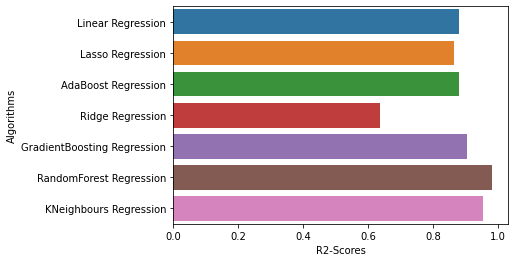

In [53]:
sns.barplot(x='R2-Scores' , y='Algorithms' , data=compare)

c:\users\dileep\appdata\local\programs\python\python38\lib\site-packages\seaborn\categorical.py:3704: UserWarning:

The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.

c:\users\dileep\appdata\local\programs\python\python38\lib\site-packages\seaborn\categorical.py:3710: UserWarning:

The `size` parameter has been renamed to `height`; please update your code.



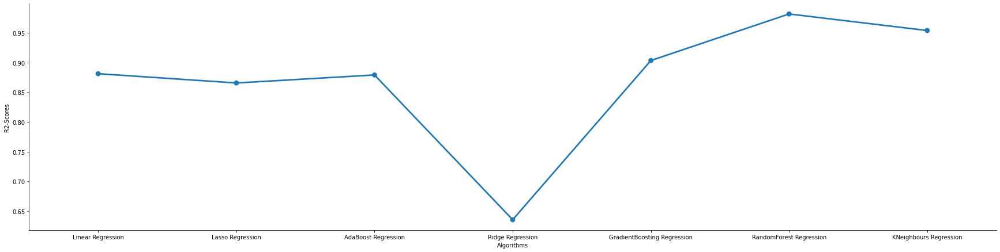

In [54]:
sns.factorplot(x='Algorithms', y='R2-Scores' , data=compare, size=6 , aspect=4)

Random Forest Regressor gives us the highest R2-Score [ 98% ] 

In [18]:

import sklearn
from sklearn import svm, preprocessing 
#import cufflinks as cf

In [19]:
X = Data.drop(['price'], axis = 1)
y =Data.price

In [20]:
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

In [21]:
Data = sklearn.utils.shuffle(Data)
X = Data.drop(['price'], axis = 1).values
X = preprocessing.scale(X)
y = Data['price'].values
y = preprocessing.scale(y)

In [22]:
test_size = 200
X_train = X[: -test_size]
y_train = y[: -test_size]
X_test = X[-test_size :]
y_test =  y[-test_size :]

In [23]:
clf = svm.SVR(kernel = 'linear')
clf.fit(X_train, y_train)

SVR(kernel='linear')

In [24]:
clf.score(X_test, y_test)

0.9060221536244932

In [26]:
y_pred = clf.predict(X_test)

In [27]:
trace0 = go.Scatter(
    y = y_test,
    x = np.arange(200), 
    mode = 'lines', 
    name = 'Actual Price',
    marker = dict(
    color = 'rgb(10, 150, 50)')
)

trace1 = go.Scatter(
    y = y_pred,
    x = np.arange(200), 
    mode = 'lines', 
    name = 'Predicted Price',
    line = dict(
        color = 'rgb(110, 50, 140)',
        dash = 'dot'
    )
)


layout = go.Layout(
    xaxis = dict(title = 'Index'), 
    yaxis = dict(title = 'Normalized Price')
)

figure = go.Figure(data = [trace0, trace1], layout = layout)
iplot(figure)

In [28]:
X = Data.drop(['price'], axis = 1)
y =Data.price

In [29]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y, train_size = 0.75, random_state = 0)

In [30]:
model = DecisionTreeRegressor(random_state = 0)
model.fit(X_train, y_train)

DecisionTreeRegressor(random_state=0)

In [31]:
from sklearn.metrics import mean_absolute_error

In [32]:
predictions = model.predict(X_test)
print(mean_absolute_error(y_test, predictions))

366.96584517776955


In [33]:
def get_mae(max_leaf_nodes,X_train,X_test,y_train,y_test):
    model = DecisionTreeRegressor(max_leaf_nodes = max_leaf_nodes, random_state =0)
    model.fit(X_train, y_train)
    pred = model.predict(X_test)
    mae = mean_absolute_error(y_test, pred)
    return(mae)

In [34]:
for max_leaf_nodes in [5,50,500,5000,6000]:
    my_mae = get_mae(max_leaf_nodes,X_train,X_test,y_train,y_test)
    print("Max leaf nodes: %d \t\t Mean Absolute Error: %d" %(max_leaf_nodes, my_mae))

Max leaf nodes: 5 		 Mean Absolute Error: 993
Max leaf nodes: 50 		 Mean Absolute Error: 506
Max leaf nodes: 500 		 Mean Absolute Error: 348
Max leaf nodes: 5000 		 Mean Absolute Error: 346
Max leaf nodes: 6000 		 Mean Absolute Error: 348


In [35]:
model = DecisionTreeRegressor(max_leaf_nodes = 5000,random_state = 0, criterion = 'mae')
model.fit(X_train, y_train)

DecisionTreeRegressor(criterion='mae', max_leaf_nodes=5000, random_state=0)

In [36]:
predictions = model.predict(X_test)
print(mean_absolute_error(y_test, predictions))

330.3539488320356


In [37]:
model.score(X_train, y_train) #train_score

0.995205432541367

In [38]:
model.score(X_test, y_test) #test score

0.9695557304368276